In [1]:
from PIL import Image
from pathlib import Path
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import hashlib


In [2]:
# Función que recibe la ruta de una imagen y devuelve el nombre de la carpeta donde está (NOMBRE DE LA CLASE)
def get_class(x):
    return x.parent.name

In [3]:
# Agarra las imágenes de TRAIN 
data_dir = r'data/Split_smol/train/'
valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}

files = []

# Buscamos recursivamente usando rglob
for x in Path(data_dir).rglob('*'):
    if x.is_file() and x.suffix.lower() in valid_extensions:
        try:
            with Image.open(x) as img:
                files.append((x, get_class(x), img.size, img.mode))
        except Exception:
            pass 

df_train = pd.DataFrame(files, columns=["path", "class", "resolution", "mode"])

In [4]:
# Agarra las imágenes de VAL 
data_dir = r'data/Split_smol/val/'
valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}

files = []
for x in Path(data_dir).rglob('*'):
    if x.is_file() and x.suffix.lower() in valid_extensions:
        try:
            with Image.open(x) as img:
                files.append((x, get_class(x), img.size, img.mode))
        except Exception:
            pass

df_val = pd.DataFrame(files, columns=["path", "class", "resolution", "mode"])

In [5]:
# SPLIT DEL TEST (Actualizado en el EDA para máxima seguridad)

np.random.seed(42)

df_val_completo = df_val.copy()

# Ordenamos por path para asegurarnos de que la licuadora del random reciba los archivos en el mismo orden exacto
df_val_completo = df_val_completo.sort_values(by="path").reset_index(drop=True)


df_test = df_val_completo.groupby('class', group_keys=False).apply(
    lambda x: x.sample(frac=0.5, random_state=42)
)

# El nuevo df_val va a ser todo lo que NO se fue a test
df_val = df_val_completo.drop(df_test.index).reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

C:\Users\Sofia\AppData\Local\Temp\ipykernel_1820\247348231.py:11: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_test = df_val_completo.groupby('class', group_keys=False).apply(


# 0.  Introducción

El dataset contiene imágenes de 9 condiciones dermatológicas distintas, divididas en conjuntos de entrenamiento y validación. Antes de entrenar cualquier modelo, es importante entender la estructura y características de los datos.

# 1. Distribucion de clases del dataset

La siguiente tabla muestra la cantidad de imágenes por clase en los conjuntos de entrenamiento y validación. 

In [6]:
# Tabla resumen de distribucion de clases en el datset

train_counts = df_train.groupby("class").size().reset_index(name='Train')
val_counts = df_val.groupby("class").size().reset_index(name='Val')


tabla = train_counts.merge(val_counts, on='class', how='left').fillna(0)


tabla['Val'] = tabla['Val'].astype(int)
tabla['Total'] = tabla['Train'] + tabla['Val']

tabla = tabla.sort_values('Total', ascending=False).reset_index(drop=True)
tabla.columns = ['Clase', 'Train', 'Val', 'Total']

tabla.style\
    .set_caption("Distribución de imágenes por clase")\
    .set_properties(**{
        'background-color': 'white',
        'color': '#333333',
        'border': '1px solid #f4a7b9',
        'text-align': 'center',
        'font-family': 'Georgia',
        'padding': '8px'
    })\
    .set_table_styles([{
        'selector': 'th',
        'props': [
            ('background-color', 'white'),
            ('color', '#333333'),
            ('font-size', '13px'),
            ('text-align', 'center'),
            ('padding', '10px'),
            ('border-bottom', '2px solid #f4a7b9')
        ]
    }, {
        'selector': 'caption',
        'props': [
            ('font-size', '15px'),
            ('color', '#333333'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]
    }])\
    .highlight_min(subset=['Train'], color='#fce4ec')

,Clase,Train,Val,Total
0,Atopic Dermatitis,81,11,92
1,Actinic keratosis,80,10,90
2,Benign keratosis,80,10,90
3,Dermatofibroma,80,10,90
4,Melanocytic nevus,80,10,90
5,Melanoma,80,10,90
6,Squamous cell carcinoma,80,10,90
7,Vascular lesion,80,10,90
8,Tinea Ringworm Candidiasis,55,9,64


Como se puede observar el dataset está bastante balanceado, con aproximadamente 80 imágenes por clase en TRAIN y 10 en VAL. Sin embargo la clase **Tinea Ringworm Candidiasis** (resaltada en rosa),  cuenta con menos imágenes en el Dataset de entrenamiento, y por ende en el total. 

A su vez, se puede visualizar la misma informacion de manera mas visual en el siguiente histograma.

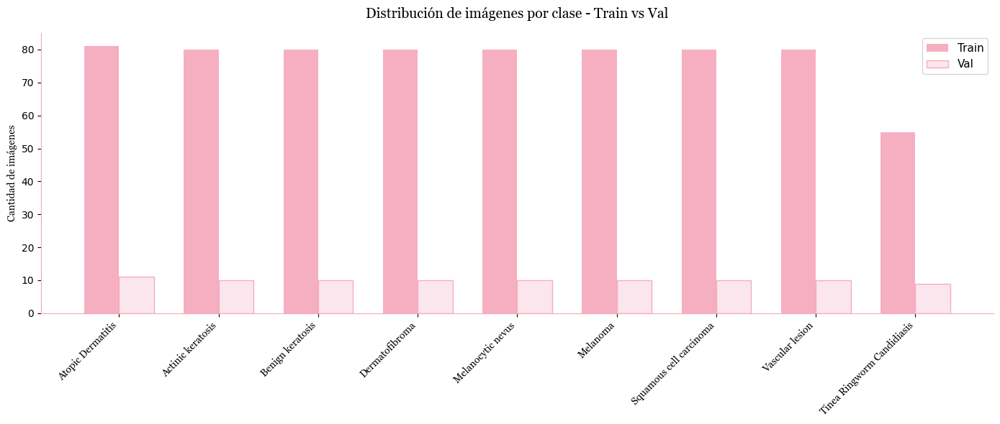

In [7]:
# Histograma mostrando cuántas imágenes hay de cada clase, comparando train y val.
train_cls = df_train.groupby("class").size().reset_index(name='count_train')
val_cls = df_val.groupby("class").size().reset_index(name='count_val')

merged_cls = train_cls.merge(val_cls, on='class', how='left').fillna(0)
merged_cls = merged_cls.sort_values('count_train', ascending=False)

x = np.arange(len(merged_cls))
width = 0.35

fig, ax = plt.subplots(figsize=(14, 6)) 


ax.bar(x - width/2, merged_cls['count_train'], width, label='Train', color='#f4a7b9', alpha=0.9)
ax.bar(x + width/2, merged_cls['count_val'], width, label='Val', color='#fce4ec', edgecolor='#f4a7b9', linewidth=1, alpha=0.9)

ax.set_xticks(x)
ax.set_xticklabels(merged_cls['class'], rotation=45, ha='right', fontfamily='Georgia')
ax.set_ylabel('Cantidad de imágenes', fontfamily='Georgia')
ax.set_title('Distribución de imágenes por clase - Train vs Val', fontfamily='Georgia', fontsize=14, pad=15)
ax.legend(fontsize=11)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')

plt.tight_layout()
plt.show()

# 2. Distribucion de resoluciones del dataset

La siguiente tabla muestra la cantidad de imágenes de cada resolucion (tamaño) en los conjuntos de entrenamiento y validación, para las 9 clases. 


In [8]:
# Tabla resumen de resoluciones más frecuentes
train_res = df_train.groupby("resolution").size().reset_index(name='Train')
val_res = df_val.groupby("resolution").size().reset_index(name='Val')


tabla_res = train_res.merge(val_res, on='resolution', how='left').fillna(0)


tabla_res['Val'] = tabla_res['Val'].astype(int)
tabla_res['Total'] = tabla_res['Train'] + tabla_res['Val']


tabla_res = tabla_res.sort_values('Train', ascending=False).head(10).reset_index(drop=True)
tabla_res.columns = ['Resolución', 'Train', 'Val', 'Total']

tabla_res.style\
    .set_caption("Top 10 resoluciones más frecuentes")\
    .set_properties(**{
        'background-color': 'white',
        'color': '#333333',
        'border': '1px solid #f4a7b9',
        'text-align': 'center',
        'font-family': 'Georgia',
        'padding': '8px'
    })\
    .set_table_styles([{
        'selector': 'th',
        'props': [
            ('background-color', 'white'),
            ('color', '#333333'),
            ('font-size', '13px'),
            ('text-align', 'center'),
            ('padding', '10px'),
            ('border-bottom', '2px solid #f4a7b9')
        ]
    }, {
        'selector': 'caption',
        'props': [
            ('font-size', '15px'),
            ('color', '#333333'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]
    }])

,Resolución,Train,Val,Total
0,"(600, 450)",320,40,360
1,"(1024, 768)",108,15,123
2,"(294, 222)",81,11,92
3,"(1024, 764)",60,8,68
4,"(1022, 767)",16,1,17
5,"(767, 576)",10,1,11
6,"(919, 802)",5,0,5
7,"(1024, 682)",4,0,4
8,"(1024, 681)",4,0,4
9,"(1024, 680)",3,0,3


El dataset presenta una gran variedad de resoluciones, siendo la más común **(600, 450)** con 400 imágenes en total. Dado que las imágenes tienen distintos tamaños, es necesario redimensionarlas todas a una resolución fija antes de entrenar. 

A su vez, se puede visualizar la misma informacion de manera mas visual en el siguiente histograma.

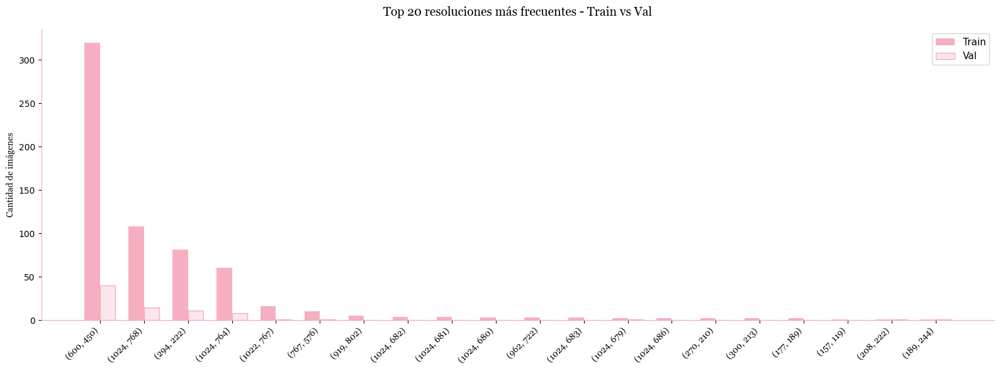

In [9]:
# Histograma mostrando cuántas imágenes hay de cada resolución, comparando train y val.
train_res = df_train.groupby("resolution").size().reset_index(name='count_train')
val_res = df_val.groupby("resolution").size().reset_index(name='count_val')


merged = train_res.merge(val_res, on='resolution', how='left').fillna(0)
merged = merged.sort_values('count_train', ascending=False).head(20)

x = np.arange(len(merged))
width = 0.35

fig, ax = plt.subplots(figsize=(16, 6)) 
ax.bar(x - width/2, merged['count_train'], width, label='Train', color='#f4a7b9', alpha=0.9)

ax.bar(x + width/2, merged['count_val'], width, label='Val', color='#fce4ec', edgecolor='#f4a7b9', linewidth=1, alpha=0.9)

ax.set_xticks(x)

labels = [str(r) for r in merged['resolution']]
ax.set_xticklabels(labels, rotation=45, ha='right', fontfamily='Georgia')

ax.set_ylabel('Cantidad de imágenes', fontfamily='Georgia')
ax.set_title('Top 20 resoluciones más frecuentes - Train vs Val', fontfamily='Georgia', fontsize=14, pad=15)
ax.legend(fontsize=11)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')

plt.tight_layout()
plt.show()

# 3. Análisis de Duplicados y Data Leakage

In [10]:
df_train = df_train.copy()
df_val = df_val.copy()

def image_hash(path):
    hasher = hashlib.md5()
    try:
        with open(path, "rb") as f:
            for chunk in iter(lambda: f.read(65536), b""):
                hasher.update(chunk)
        return hasher.hexdigest()
    except Exception:
        return None

df_train["md5_hash"] = df_train["path"].apply(image_hash)
df_val["md5_hash"] = df_val["path"].apply(image_hash)

train_hashes = df_train["md5_hash"].dropna()
val_hashes = df_val["md5_hash"].dropna()

dup_train = train_hashes.duplicated().sum()
dup_val = val_hashes.duplicated().sum()

shared_hashes = set(train_hashes.unique()).intersection(set(val_hashes.unique()))
cross_duplicates = len(shared_hashes)

#TABLAS
estilo_base = {
    'background-color': 'white',
    'color': '#333333',
    'border': '1px solid #f4a7b9',
    'text-align': 'center',
    'font-family': 'Georgia',
    'padding': '8px'
}

estilo_headers = [{
    'selector': 'th',
    'props': [
        ('background-color', 'white'),
        ('color', '#333333'),
        ('font-size', '13px'),
        ('text-align', 'center'),
        ('padding', '10px'),
        ('border-bottom', '2px solid #f4a7b9')
    ]
}, {
    'selector': 'caption',
    'props': [
        ('font-size', '15px'),
        ('color', '#333333'),
        ('font-weight', 'bold'),
        ('padding', '10px')
    ]
}]

#1
duplicates_table = pd.DataFrame({
    "Chequeo": [
        "Duplicados en Train",
        "Duplicados en Validation",
        "Duplicados entre Train y Validation"
    ],
    "Cantidad": [dup_train, dup_val, cross_duplicates]
})

st_resumen = duplicates_table.style\
    .set_caption("Sanity check: detección de duplicados y data leakage")\
    .set_properties(**estilo_base)\
    .set_table_styles(estilo_headers)\
    .apply(lambda col: ['background-color: #fce4ec' if v > 0 else '' for v in col], subset=['Cantidad'])

display(st_resumen)

#2
if dup_train > 0:
    df_dup_train = df_train[df_train["md5_hash"].duplicated(keep=False)].sort_values("md5_hash")
    train_visual = pd.DataFrame({
        "Clase": df_dup_train["class"],
        "Imagen duplicada en Train": df_dup_train["path"].apply(lambda x: Path(x).name)
    }).reset_index(drop=True)
    
    st_train = train_visual.style\
        .set_caption("Detalle: registros duplicados dentro de Train")\
        .set_properties(**estilo_base)\
        .set_table_styles(estilo_headers)
    display(st_train)

#3
if dup_val > 0:
    df_dup_val = df_val[df_val["md5_hash"].duplicated(keep=False)].sort_values("md5_hash")
    val_visual = pd.DataFrame({
        "Clase": df_dup_val["class"],
        "Imagen duplicada en Validation": df_dup_val["path"].apply(lambda x: Path(x).name)
    }).reset_index(drop=True)
    
    st_val = val_visual.style\
        .set_caption("Detalle: registros duplicados dentro de Validation")\
        .set_properties(**estilo_base)\
        .set_table_styles(estilo_headers)
    display(st_val)

#4
if cross_duplicates > 0:
    df_leakage = df_train[df_train["md5_hash"].isin(shared_hashes)].drop_duplicates(subset=["md5_hash"])
    leakage_visual = pd.DataFrame({
        "Clase": df_leakage["class"],
        "Imagen con Leakage": df_leakage["path"].apply(lambda x: Path(x).name),
        "Repetida en Validation": "Sí"
    }).reset_index(drop=True)
    
    st_leakage = leakage_visual.style\
        .set_caption("Alerta: imágenes cruzadas entre Train y Validation (Data Leakage)")\
        .set_properties(**estilo_base)\
        .set_table_styles(estilo_headers)
    display(st_leakage)

,Chequeo,Cantidad
0,Duplicados en Train,1
1,Duplicados en Validation,0
2,Duplicados entre Train y Validation,17


,Clase,Imagen duplicada en Train
0,Atopic Dermatitis,1_49.jpg
1,Atopic Dermatitis,1_51.jpg


,Clase,Imagen con Leakage,Repetida en Validation
0,Atopic Dermatitis,1_16.jpg,Sí
1,Atopic Dermatitis,1_18.jpg,Sí
2,Atopic Dermatitis,1_20.jpg,Sí
3,Atopic Dermatitis,1_23.jpg,Sí
4,Atopic Dermatitis,1_25.jpg,Sí
5,Atopic Dermatitis,1_26.jpg,Sí
6,Atopic Dermatitis,1_29.jpg,Sí
7,Atopic Dermatitis,1_30.jpg,Sí
8,Atopic Dermatitis,1_35.jpg,Sí
9,Atopic Dermatitis,1_43.jpg,Sí


### ¿Qué encontramos con este chequeo?

* **Data Leakage (Filtraciones):** Hay imágenes que se están repitiendo tanto en TRAIN como en VAL. Hay que sacarlas de VAL sí o sí.
* **Duplicados internos:** Hay fotos idénticas metidas dentro del mismo conjunto (en TRAIN). 

# 4. ¿Hay imágenes que no son RGB?

In [11]:
# Verificar si hay imágenes que no son RGB 
no_rgb_train = df_train[df_train["mode"] != "RGB"]
no_rgb_val   = df_val[df_val["mode"] != "RGB"]

resumen = pd.DataFrame({
    "Split": ["Train", "Val"],
    "Imágenes no RGB": [len(no_rgb_train), len(no_rgb_val)],
    "Total imágenes": [len(df_train), len(df_val)]
})

resumen.style\
    .set_caption("Sanity check: imágenes no RGB")\
    .set_properties(**{
        'background-color': 'white',
        'color': '#333333',
        'border': '1px solid #f4a7b9',
        'text-align': 'center',
        'font-family': 'Georgia',
        'padding': '8px'
    })\
    .set_table_styles([{
        'selector': 'th',
        'props': [
            ('background-color', 'white'),
            ('color', '#333333'),
            ('font-size', '13px'),
            ('text-align', 'center'),
            ('padding', '10px'),
            ('border-bottom', '2px solid #f4a7b9')
        ]
    }, {
        'selector': 'caption',
        'props': [
            ('font-size', '15px'),
            ('color', '#333333'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]
    }])\
    .apply(lambda col: ['background-color: #fce4ec' if v > 0 else '' for v in col], subset=['Imágenes no RGB'])

,Split,Imágenes no RGB,Total imágenes
0,Train,0,696
1,Val,0,90


Como se puede ver en la tabla de arriba, todo el dataset son imagenes RGB.

# 5. Ejemplos visuales de cada clase 

## 5.a. 5 imagenes por clase de entrenamiento

A continuación se muestran 5 imágenes de cada clase del conjunto de **TRAIN**. 

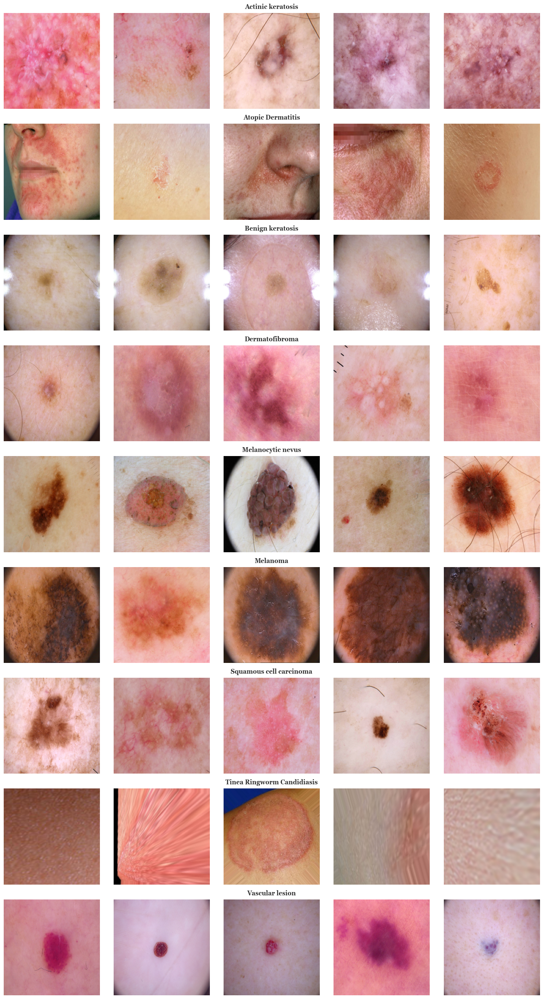

In [12]:


n_imgs = 5
classes = sorted(df_train["class"].unique())
n_classes = len(classes)


fig, axes = plt.subplots(nrows=n_classes, ncols=n_imgs, figsize=(15, 3 * n_classes))


aux_df = df_train.sort_values("class").groupby("class").head(n_imgs).reset_index(drop=True)

idx = 0
for row in range(n_classes):
    cls = classes[row]
   
    clase_df = aux_df[aux_df["class"] == cls]
    
    for col in range(n_imgs):
        ax = axes[row, col]
        
        
        if col < len(clase_df):
            img_path = clase_df["path"].iloc[col]
            try:
                with Image.open(img_path) as img:
                    img_resized = img.resize((224, 224))
                    ax.imshow(img_resized)
            except Exception:
                ax.text(0.5, 0.5, "Error al abrir", ha="center", va="center")
        
        ax.axis('off')

    axes[row, 2].set_title(cls, fontsize=12, fontweight='bold', 
                           color='#333333', fontfamily='Georgia', pad=8)

plt.tight_layout()
plt.show()

## 5.b. 5 imagenes por clase de validación

A continuación se muestran 5 imágenes de cada clase del conjunto de **VAL**. 

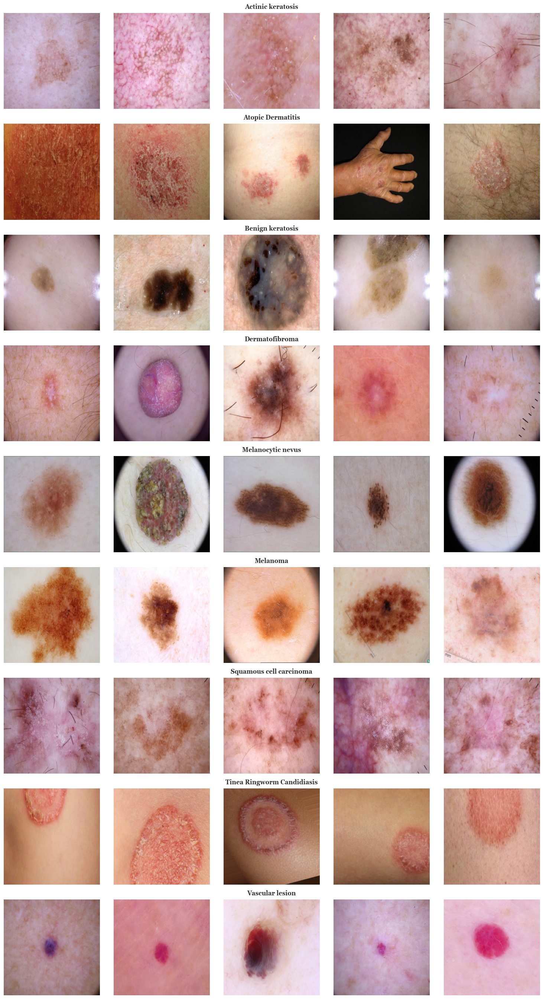

In [13]:
# Muestra 5 imágenes por cada una de las 9 clases del conjunto de VAL.

n_imgs = 5
classes = sorted(df_val["class"].unique())
n_classes = len(classes)


fig, axes = plt.subplots(nrows=n_classes, ncols=n_imgs, figsize=(15, 3 * n_classes))

aux_df_val = df_val.sort_values("class").groupby("class").head(n_imgs).reset_index(drop=True)

for row in range(n_classes):
    cls = classes[row]
    clase_df = aux_df_val[aux_df_val["class"] == cls]
    
    for col in range(n_imgs):
        ax = axes[row, col]
        
        
        if col < len(clase_df):
            img_path = clase_df["path"].iloc[col]
            try:
                with Image.open(img_path) as img:
                    img_resized = img.resize((224, 224))
                    ax.imshow(img_resized)
            except Exception:
                ax.text(0.5, 0.5, "Error al abrir", ha="center", va="center")
        
        ax.axis('off')
    
  
    axes[row, 2].set_title(cls, fontsize=12, fontweight='bold', 
                           color='#333333', fontfamily='Georgia', pad=8)

plt.tight_layout()
plt.show()

# 6. Varianza intra-clase

## 6.a.Varianza TRAIN vs VAL 

La varianza intra-clase mide qué tan distintas son las imágenes dentro de una misma clase. Una varianza alta indica que el modelo tendrá más dificultad aprendiendo patrones consistentes, y que técnicas como data augmentation y regularización serán más necesarias. Se compara train y val para verificar consistencia.

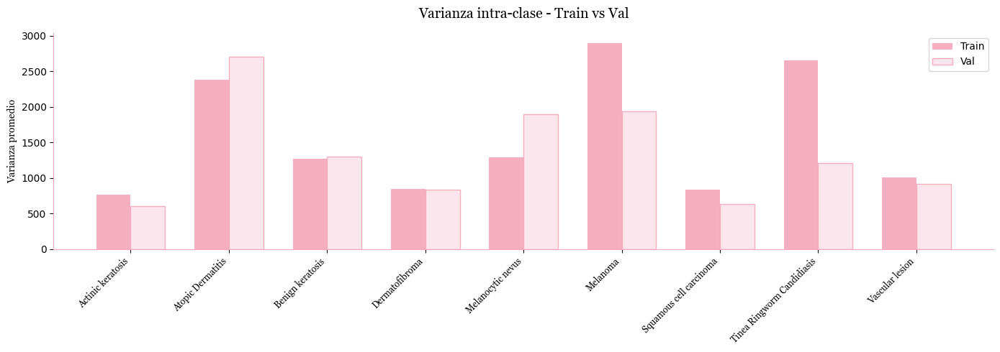

In [14]:
# Varianza intra-clase (Train vs Val)
target_size = (64, 64)
classes = sorted(df_train["class"].unique())

varianzas_train = {}
varianzas_val = {}

# Procesamos Train
for cls in classes:
    paths_train = df_train[df_train["class"] == cls]["path"]
    flat_imgs = []
    
    for path in paths_train:
        try:
            with Image.open(path) as img:
                img_flat = np.array(img.convert("RGB").resize(target_size)).flatten()
                flat_imgs.append(img_flat)
        except Exception:
            pass
            
    if flat_imgs:
        imgs_array_train = np.array(flat_imgs)
        varianzas_train[cls] = imgs_array_train.var(axis=0).mean()
    else:
        varianzas_train[cls] = 0

# Procesamos Val
for cls in classes:
    paths_val = df_val[df_val["class"] == cls]["path"]
    flat_imgs_val = []
    
    for path in paths_val:
        try:
            with Image.open(path) as img:
                img_flat = np.array(img.convert("RGB").resize(target_size)).flatten()
                flat_imgs_val.append(img_flat)
        except Exception:
            pass
            
    if flat_imgs_val:
        imgs_array_val = np.array(flat_imgs_val)
        varianzas_val[cls] = imgs_array_val.var(axis=0).mean()
    else:
        varianzas_val[cls] = 0

#Grafico
x = np.arange(len(classes))
width = 0.35

fig, ax = plt.subplots(figsize=(14, 5))
ax.bar(x - width/2, [varianzas_train[c] for c in classes], width, 
       label='Train', color='#f4a7b9', alpha=0.9)

ax.bar(x + width/2, [varianzas_val[c] for c in classes], width, 
       label='Val', color='#fce4ec', edgecolor='#f4a7b9', linewidth=1, alpha=0.9)

ax.set_xticks(x)
ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=9, fontfamily='Georgia')
ax.set_ylabel('Varianza promedio', fontfamily='Georgia')
ax.set_title('Varianza intra-clase - Train vs Val', fontsize=14, pad=15, fontfamily='Georgia')
ax.legend(fontsize=10)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')

plt.tight_layout()
plt.show()

Conclusiones:  En cuanto a la varianza intra-clase, **Melanoma y Atopic Dermatitis** presentan la mayor dispersión visual, es mas dificil que el modelo aprenda patrones consistentes. Por su parte, **Actinic keratosis y Dermatofibroma** muestran baja varianza. 

Un caso particular es **Tinea Ringworm Candidiasis**, como ya mencionamos, es la clase con menor representación general, y con  menos imágenes en TRAIN (55) que el resto: la diferencia observada en su varianza entre TRAIN y VAL podría explicarse por esto más que por una real heterogeneidad visual de la clase. Esta diferencia se analiza en la sección siguiente.

## 6.b. ¿ Se debe a esta cantidad menor de imagenes ( totales y de TRAIN) ?



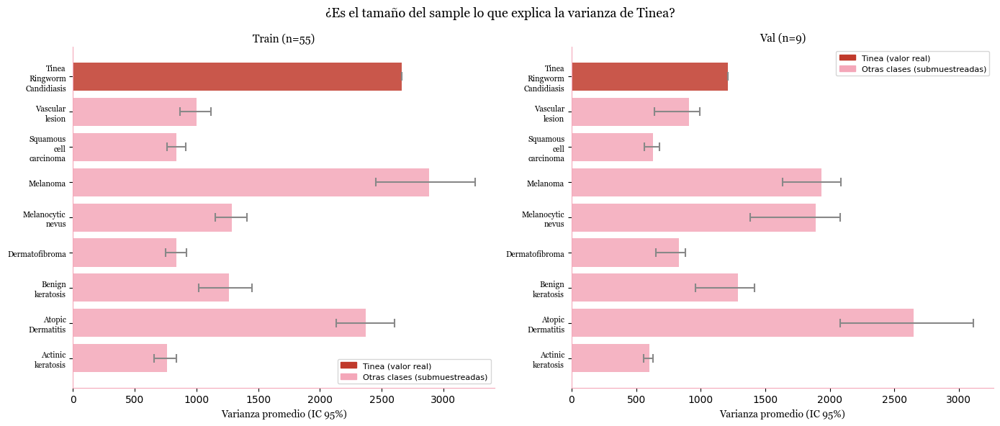

In [15]:

target_size = (64, 64)
classes = sorted(df_train["class"].unique())

TINEA_CLASS = "Tinea Ringworm Candidiasis"
N_ITER = 500

arrays_train = {}
arrays_val = {}

for cls in classes:
    paths_train = df_train[df_train["class"] == cls]["path"]
    flat_train = []
    for path in paths_train:
        try:
            with Image.open(path) as img:
                flat_train.append(np.array(img.convert("RGB").resize(target_size)).flatten())
        except Exception:
            pass
    arrays_train[cls] = np.array(flat_train)

    paths_val = df_val[df_val["class"] == cls]["path"]
    flat_val = []
    for path in paths_val:
        try:
            with Image.open(path) as img:
                flat_val.append(np.array(img.convert("RGB").resize(target_size)).flatten())
        except Exception:
            pass
    arrays_val[cls] = np.array(flat_val)

tinea_var_real = arrays_train[TINEA_CLASS].var(axis=0).mean()
tinea_var_val  = arrays_val[TINEA_CLASS].var(axis=0).mean()

def bootstrap_variance(arr, n_samples, n_iter=N_ITER, seed=42):
    rng = np.random.default_rng(seed)
    return np.array([
        arr[rng.choice(len(arr), size=n_samples, replace=False)].var(axis=0).mean()
        for _ in range(n_iter)
    ])

n_tinea_train = len(arrays_train[TINEA_CLASS])
n_tinea_val   = len(arrays_val[TINEA_CLASS])

boot_train = {
    cls: bootstrap_variance(arrays_train[cls], n_samples=n_tinea_train)
    for cls in classes
    if cls != TINEA_CLASS and len(arrays_train[cls]) >= n_tinea_train
}
boot_val = {
    cls: bootstrap_variance(arrays_val[cls], n_samples=n_tinea_val)
    for cls in classes
    if cls != TINEA_CLASS and len(arrays_val[cls]) >= n_tinea_val
}

assert len(boot_train) > 0, "No hay clases en train con suficientes imágenes para el bootstrap"
assert len(boot_val) > 0, "No hay clases en val con suficientes imágenes para el bootstrap"

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('¿Es el tamaño del sample lo que explica la varianza de Tinea?',
             fontfamily='Georgia', fontsize=13, y=0.98)

for ax, boot, tinea_var, label, n_samples in [
    (axes[0], boot_train, tinea_var_real, 'Train', n_tinea_train),
    (axes[1], boot_val,   tinea_var_val,  'Val',   n_tinea_val)
]:
    cls_labels = [cls.replace(' ', '\n') for cls in boot] + [TINEA_CLASS.replace(' ', '\n')]
    means = [np.mean(v) for v in boot.values()] + [tinea_var]
    lo    = [np.percentile(v, 2.5) for v in boot.values()] + [tinea_var]
    hi    = [np.percentile(v, 97.5) for v in boot.values()] + [tinea_var]

    y_pos = np.arange(len(cls_labels))
    bar_colors = ['#f4a7b9'] * (len(cls_labels) - 1) + ['#c0392b']

    ax.barh(y_pos, means,
            xerr=[np.array(means)-np.array(lo), np.array(hi)-np.array(means)],
            color=bar_colors, alpha=0.85, capsize=4,
            error_kw={'ecolor': '#888', 'capthick': 1.5})

    ax.set_yticks(y_pos)
    ax.set_yticklabels(cls_labels, fontsize=8, fontfamily='Georgia')
    ax.set_xlabel('Varianza promedio (IC 95%)', fontfamily='Georgia')
    ax.set_title(f'{label} (n={n_samples})', fontfamily='Georgia', fontsize=11)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('#f4a7b9')
    ax.spines['bottom'].set_color('#f4a7b9')
    ax.legend(handles=[
        mpatches.Patch(color='#c0392b', label='Tinea (valor real)'),
        mpatches.Patch(color='#f4a7b9', label='Otras clases (submuestreadas)')
    ], fontsize=8)

plt.tight_layout()
plt.show()



### Análisis de Bootstrap: ¿La varianza de Tinea se debe al tamaño del sample?

Para verificar si la alta varianza observada en Tinea Ringworm Candidiasis se debe a su menor cantidad de imágenes o a una heterogeneidad visual real, se aplicó bootstrapping: se submuestreó cada clase 500 veces  y se calculó la varianza en cada iteración, obteniendo así una distribución de varianzas esperadas para ese tamaño.

**TRAIN:** Si miramos el gráfico, Tinea (la barra roja) es de las más largas pero no la única, Melanoma se le acerca bastante. Ambas están bien separadas del resto de las clases. Esto sugiere que la alta varianza de Tinea en TRAIN no se debe al tamaño del sample: otras clases con el mismo n tienen varianzas menores.


**VAL:** La varianza real de Tinea en VAL (1237) cae dentro del rango esperado de las otras clases submuestreadas. Con muestras tan pequeñas, la estimación de varianza es inherentemente inestable y puede variar ampliamente entre subsets. Por lo tanto, no es posible determinar si la varianza de Tinea en VAL refleja una característica real de la clase

# 7. Imagenes Atípicas por Clase

## 7.a. Imagenes Atípicas por Clase en TRAIN 

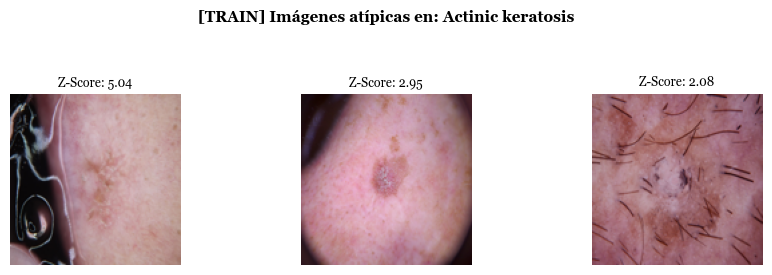

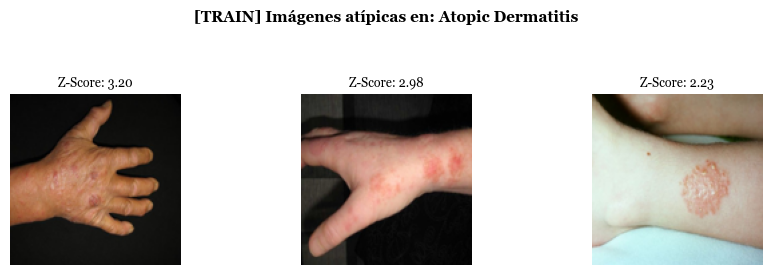

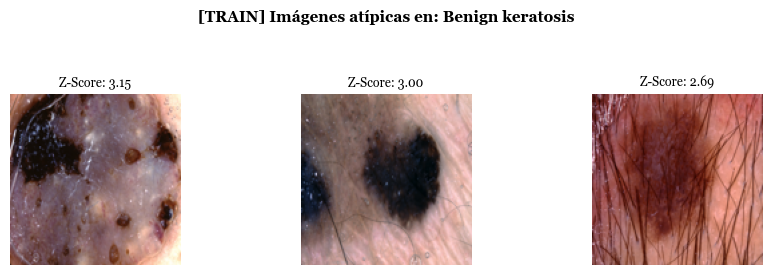

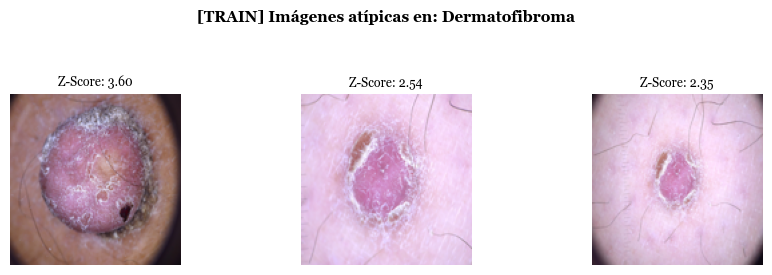

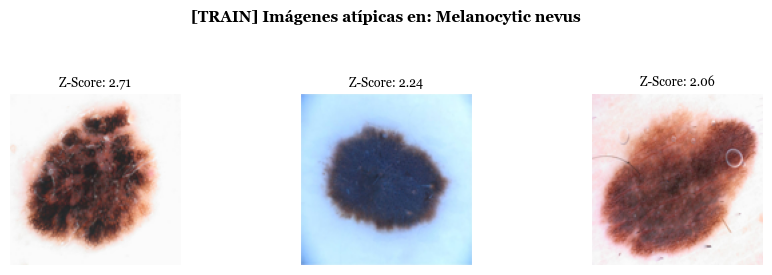

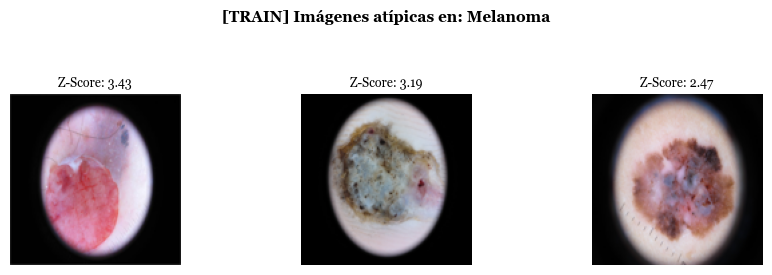

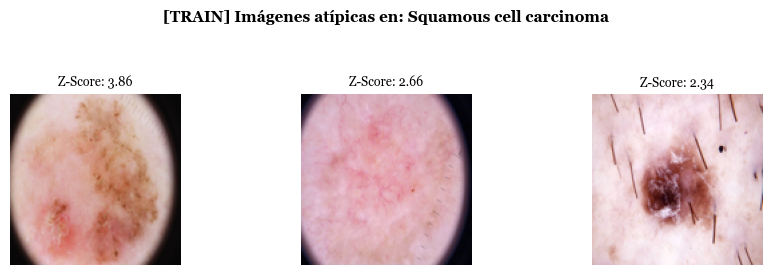

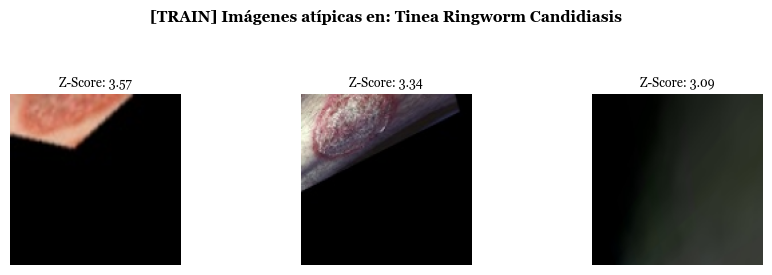

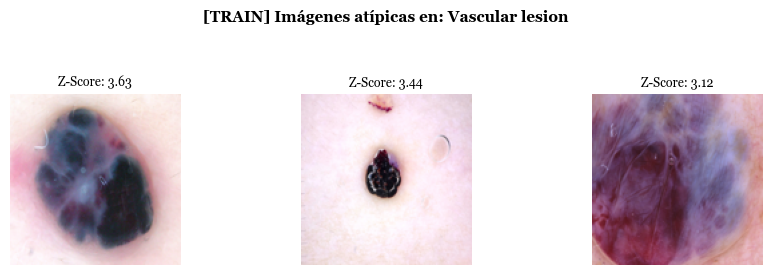

In [16]:
target_size = (64, 64)
n_outliers_to_show = 3

classes_train = sorted(df_train["class"].unique())

for cls in classes_train:
    paths = df_train[df_train["class"] == cls]["path"].values
    if len(paths) == 0:
        continue
        
    flat_imgs = []
    for path in paths:
        try:
            with Image.open(path) as img:
                flat_imgs.append(np.array(img.convert("RGB").resize(target_size)).flatten())
        except Exception:
            pass
            
    if not flat_imgs:
        continue
        
    imgs_array = np.array(flat_imgs)
    mean_vector = imgs_array.mean(axis=0)
    
    distancias = np.linalg.norm(imgs_array - mean_vector, axis=1)
    valid_paths = np.array(paths)
    
    mean_dist = np.mean(distancias)
    std_dist = np.std(distancias) if np.std(distancias) > 0 else 1
    z_scores = (distancias - mean_dist) / std_dist
    
    idx_anormales = np.argsort(z_scores)[::-1][:n_outliers_to_show]
    
    fig, axes = plt.subplots(1, n_outliers_to_show, figsize=(9, 2.5))
    fig.suptitle(f"[TRAIN] Imágenes atípicas en: {cls}", 
                 fontsize=11, fontweight='bold', fontfamily='Georgia', y=1.08)
    
    for idx_ax, idx_img in enumerate(idx_anormales):
        ax = axes[idx_ax]
        if idx_img < len(valid_paths):
            img_path = valid_paths[idx_img]
            z_val = z_scores[idx_img]
            
            try:
                with Image.open(img_path) as img:
                    ax.imshow(img.resize((128, 128)))
                ax.set_title(f"Z-Score: {z_val:.2f}", fontsize=9, fontfamily='Georgia')
            except Exception:
                ax.text(0.5, 0.5, "Error", ha="center", va="center")
        
        ax.axis('off')
        
    plt.tight_layout()
    plt.show()

Tras analizar los outliers de cada clase en TRAIN, voy a quedarme con la mayoría de las imágenes, y abordarlas en el próximo notebook con el Preprocesamiento. 

La única excepción es la imagen completamente oscura de la clase Tinea (Z-Score: 3.09). Aunque esta foto completamente negra tiene un Z-Score menor que otras, esto es porque la distancia euclídea penaliza mas a contrastes abruptos (por ejemplo el paso de piel a negro).  

## 7.b. Imagenes Atípicas por Clase en VAL 

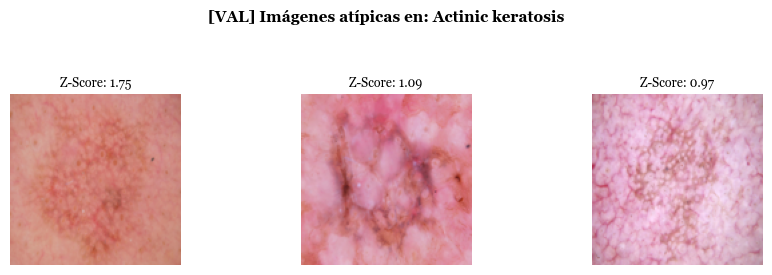

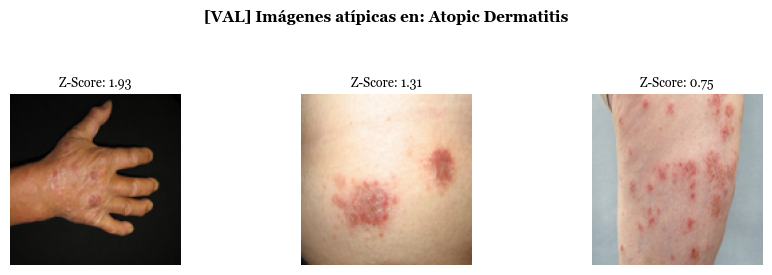

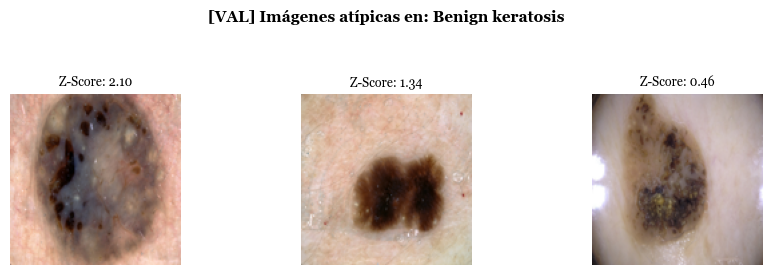

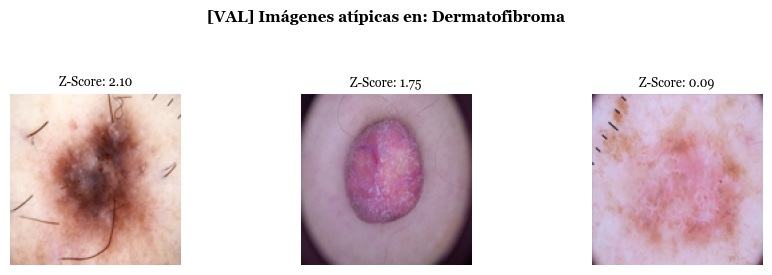

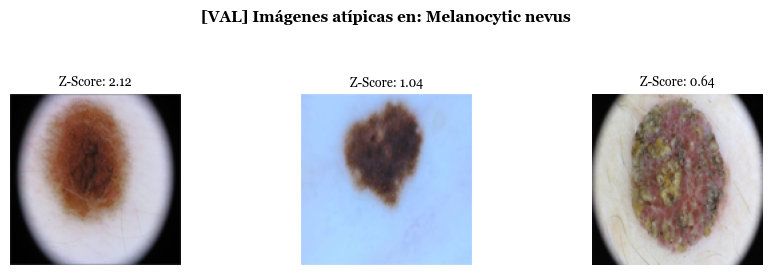

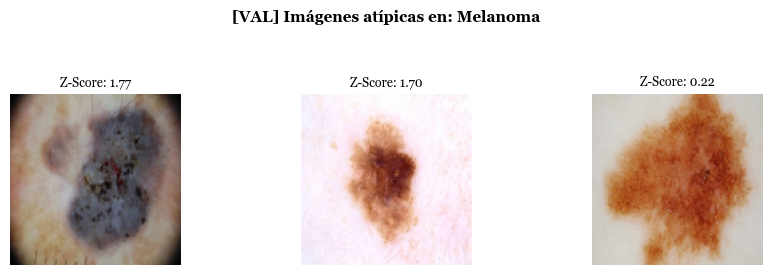

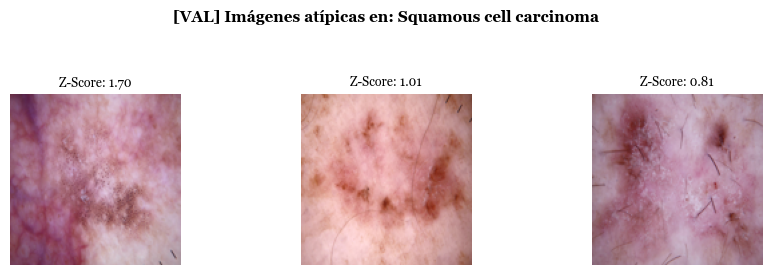

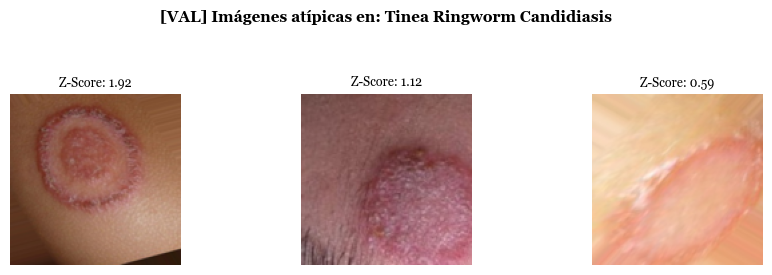

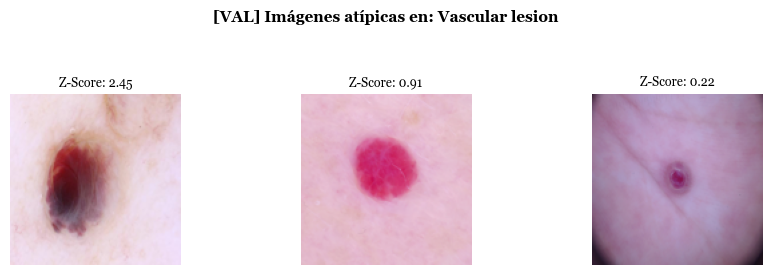

In [17]:
target_size = (64, 64)
n_outliers_to_show = 3


classes_val = sorted(df_val["class"].unique())

for cls in classes_val:
    paths = df_val[df_val["class"] == cls]["path"].values
    if len(paths) == 0:
        continue
        
    flat_imgs = []
    for path in paths:
        try:
            with Image.open(path) as img:
                flat_imgs.append(np.array(img.convert("RGB").resize(target_size)).flatten())
        except Exception:
            pass
            
    if not flat_imgs:
        continue
        
    imgs_array = np.array(flat_imgs)
    mean_vector = imgs_array.mean(axis=0)
    
    distancias = np.linalg.norm(imgs_array - mean_vector, axis=1)
    valid_paths = np.array(paths)
   
    
    mean_dist = np.mean(distancias)
    std_dist = np.std(distancias) if np.std(distancias) > 0 else 1
    z_scores = (distancias - mean_dist) / std_dist
    
    idx_anormales = np.argsort(z_scores)[::-1][:n_outliers_to_show]
    
    fig, axes = plt.subplots(1, n_outliers_to_show, figsize=(9, 2.5))
    fig.suptitle(f"[VAL] Imágenes atípicas en: {cls}", 
                 fontsize=11, fontweight='bold', fontfamily='Georgia', y=1.08)
    
    for idx_ax, idx_img in enumerate(idx_anormales):
        ax = axes[idx_ax]
        if idx_img < len(valid_paths):
            img_path = valid_paths[idx_img]
            z_val = z_scores[idx_img]
            
            try:
                with Image.open(img_path) as img:
                    ax.imshow(img.resize((128, 128)))
                ax.set_title(f"Z-Score: {z_val:.2f}", fontsize=9, fontfamily='Georgia')
            except Exception:
                ax.text(0.5, 0.5, "Error", ha="center", va="center")
        
        ax.axis('off')
        
    plt.tight_layout()
    plt.show()

Acá los outliers no se miran para limpiar, sino para saber de antemano qué fotos son las más difíciles y entender dónde  podría llegar a fallar el modelo más adelante.

# 8. HEATMAPS: Similitud visual entre clases

## 8.a. Similitud visual entre clases: con TRAIN

El siguiente heatmap muestra qué tan parecidas son las imágenes entre pares de clases en términos de colores y píxeles. Valores cercanos a 1 indican clases muy similares visualmente, ¡ el modelo va a tener  más dificultad para diferenciarlas !


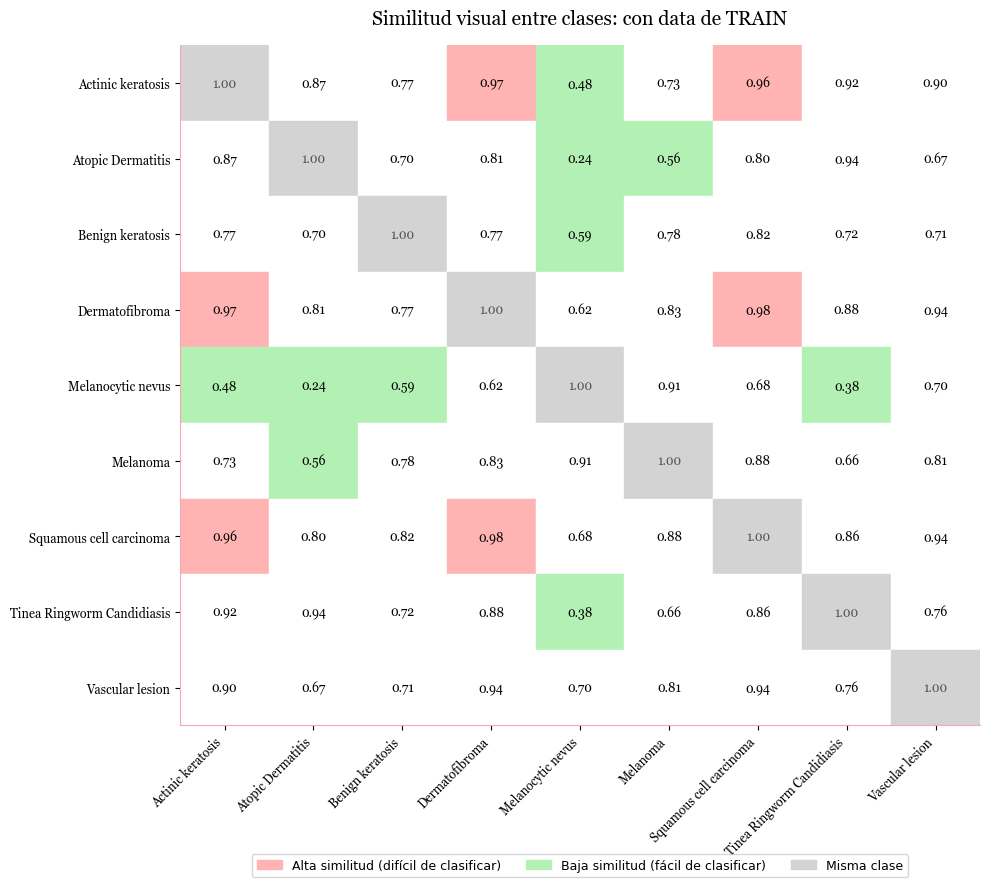

In [18]:
target_size = (64, 64)
classes = sorted(df_train["class"].unique())

class_means_train = {}
for cls in classes:
    paths = df_train[df_train["class"] == cls]["path"]
    flat_imgs = []
    
    for path in paths:
        try:
            with Image.open(path) as img:
                flat_imgs.append(np.array(img.convert("RGB").resize(target_size)).flatten())
        except Exception:
            pass
            
    if flat_imgs:
        imgs_array = np.array(flat_imgs)
        class_means_train[cls] = imgs_array.mean(axis=0)
    else:
        class_means_train[cls] = np.zeros(target_size[0] * target_size[1] * 3)

n = len(classes)
similarity_matrix_train = np.zeros((n, n))
for i, cls1 in enumerate(classes):
    for j, cls2 in enumerate(classes):
        if j < i:
            similarity_matrix_train[i, j] = similarity_matrix_train[j, i]
        else:
            with np.errstate(divide='ignore', invalid='ignore'):
                corr_matrix = np.corrcoef(class_means_train[cls1], class_means_train[cls2])
                corr = corr_matrix[0, 1]
                if np.isnan(corr):
                    corr = 1.0 if i == j else 0.0
            similarity_matrix_train[i, j] = corr

fig, ax = plt.subplots(figsize=(10, 9))

for i in range(n):
    for j in range(n):
        val = similarity_matrix_train[i, j]
        if i == j:
            color = '#d3d3d3'
        elif val >= 0.95:
            color = '#ffb3b3'
        elif val <= 0.60:
            color = '#b3f0b3'
        else:
            color = 'white'
        
        ax.add_patch(plt.Rectangle((j-0.5, i-0.5), 1, 1, color=color))
        txt_color = '#555555' if i == j else 'black'
        ax.text(j, i, f'{val:.2f}', ha='center', va='center', 
                fontsize=9, color=txt_color, fontfamily='Georgia')

ax.set_xticks(range(n))
ax.set_yticks(range(n))
ax.set_xlim(-0.5, n-0.5)
ax.set_ylim(-0.5, n-0.5)
ax.invert_yaxis()

ax.set_title('Similitud visual entre clases: con data de TRAIN', fontsize=14, pad=15, fontfamily='Georgia')
ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=9, fontfamily='Georgia')
ax.set_yticklabels(classes, fontsize=9, fontfamily='Georgia')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')

legend = [
    mpatches.Patch(color='#ffb3b3', label='Alta similitud (difícil de clasificar)'),
    mpatches.Patch(color='#b3f0b3', label='Baja similitud (fácil de clasificar)'),
    mpatches.Patch(color='#d3d3d3', label='Misma clase')
]

ax.legend(handles=legend, loc='upper center', bbox_to_anchor=(0.5, -0.18), 
          ncol=3, fontsize=9, frameon=True)

plt.tight_layout()
plt.show()


Como podemos visualizar: los pares mas dificiles de diferenciar en TRAIN: 

- **Dermatofibroma y Squamous cell carcinoma** (0.98) 
- **Actinic keratosis y Dermatofibroma** (0.97) 
- **Actinic keratosis y Squamous cell carcinoma** (0.96) 

Por su parte: los pares mas distintos/ mas faciles de diferenciar en TRAIN: 

- **Melanocytic nevus y Atopic Dermatitis** (0.24)
- **Melanocytic nevus y Actinic keratosis** (0.48) 
- **Melanoma y Atopic Dermatitis** (0.56) 



## 8.b. Similitud visual entre clases: con VAL

El siguiente heatmap muestra qué tan parecidas son las imágenes de cada par de clases en términos de colores y píxeles. Valores cercanos a 1 indican clases muy similares visualmente, ¡ el modelo va a tener  más dificultad para diferenciarlas !

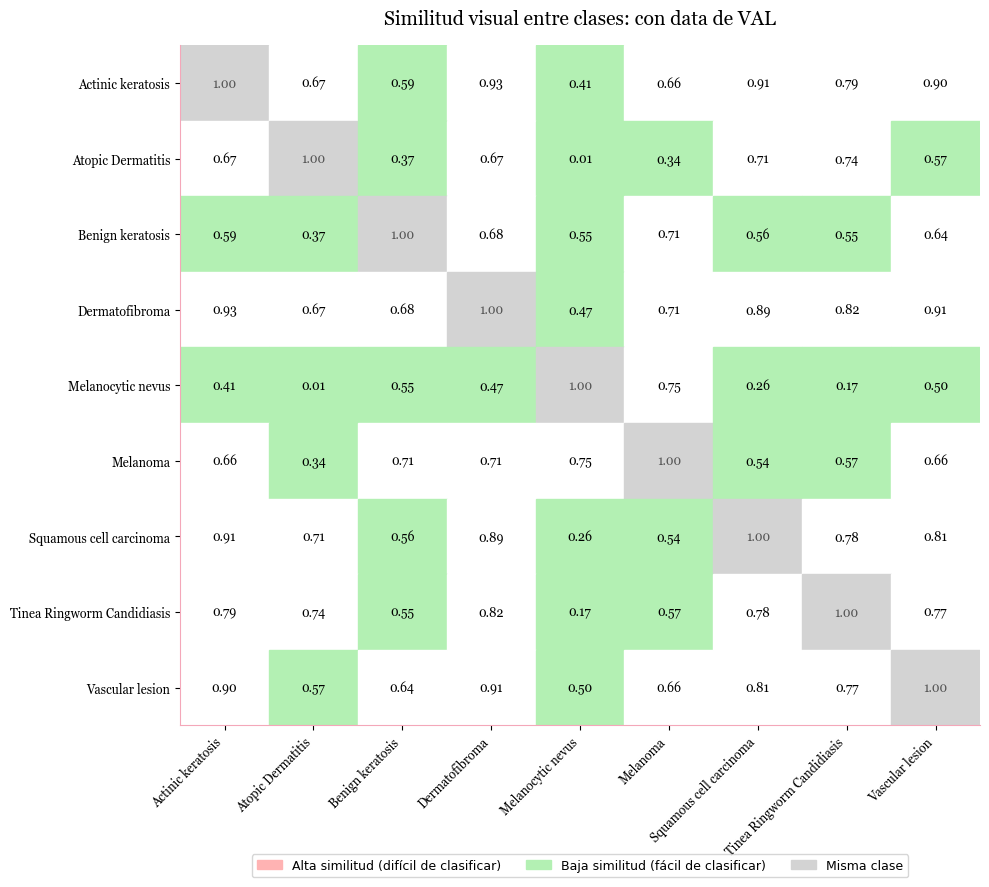

In [19]:
target_size = (64, 64)
classes = sorted(df_val["class"].unique())

class_means_val = {}
for cls in classes:
    paths = df_val[df_val["class"] == cls]["path"]
    flat_imgs = []
    
    for path in paths:
        try:
            with Image.open(path) as img:
                flat_imgs.append(np.array(img.convert("RGB").resize(target_size)).flatten())
        except Exception:
            pass
            
    if flat_imgs:
        imgs_array = np.array(flat_imgs)
        class_means_val[cls] = imgs_array.mean(axis=0)
    else:
        class_means_val[cls] = np.zeros(target_size[0] * target_size[1] * 3)

n = len(classes)
similarity_matrix_val = np.zeros((n, n))
for i, cls1 in enumerate(classes):
    for j, cls2 in enumerate(classes):
        if j < i:
            similarity_matrix_val[i, j] = similarity_matrix_val[j, i]
        else:
            with np.errstate(divide='ignore', invalid='ignore'):
                corr_matrix = np.corrcoef(class_means_val[cls1], class_means_val[cls2])
                corr = corr_matrix[0, 1]
                if np.isnan(corr):
                    corr = 1.0 if i == j else 0.0
            similarity_matrix_val[i, j] = corr

fig, ax = plt.subplots(figsize=(10, 9))

for i in range(n):
    for j in range(n):
        val = similarity_matrix_val[i, j]
        if i == j:
            color = '#d3d3d3'
        elif val >= 0.95:
            color = '#ffb3b3'
        elif val <= 0.60:
            color = '#b3f0b3'
        else:
            color = 'white'
        
        ax.add_patch(plt.Rectangle((j-0.5, i-0.5), 1, 1, color=color))
        txt_color = '#555555' if i == j else 'black'
        ax.text(j, i, f'{val:.2f}', ha='center', va='center', 
                fontsize=9, color=txt_color, fontfamily='Georgia')

ax.set_xticks(range(n))
ax.set_yticks(range(n))
ax.set_xlim(-0.5, n-0.5)
ax.set_ylim(-0.5, n-0.5)
ax.invert_yaxis()

ax.set_title('Similitud visual entre clases: con data de VAL', fontsize=14, pad=15, fontfamily='Georgia')
ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=9, fontfamily='Georgia')
ax.set_yticklabels(classes, fontsize=9, fontfamily='Georgia')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')

legend = [
    mpatches.Patch(color='#ffb3b3', label='Alta similitud (difícil de clasificar)'),
    mpatches.Patch(color='#b3f0b3', label='Baja similitud (fácil de clasificar)'),
    mpatches.Patch(color='#d3d3d3', label='Misma clase')
]

ax.legend(handles=legend, loc='upper center', bbox_to_anchor=(0.5, -0.18), 
          ncol=3, fontsize=9, frameon=True)

plt.tight_layout()
plt.show()

A diferencia de lo observado en el conjunto de Entrenamiento, en  Validación no se detectan pares de clases críticamente difíciles de diferenciar. 

Esto se debe a que, al realizar un split aleatorio y estratificado del 50% para aislar el conjunto de Test de forma temprana, el tamaño de la muestra de Validación disminuyo. 

# 9. Conclusiones del EDA

### Dataset
El dataset está bastante balanceado (aprox 80 imágenes por clase en TRAIN, y aprox 10 en VAL), con la excepción de **Tinea Ringworm Candidiasis** que tiene menos imágenes en TRAIN (55). 
Las resoluciones son muy variadas, siendo la más común **(600, 450)**, por lo que es 
necesario redimensionar todas las imágenes a una resolución fija antes de entrenar.
Todas las imágenes están en formato **RGB**. 

### Integridad de Datos (Duplicados y Leakage)
Hay imágenes que se están repitiendo tanto en TRAIN como en VAL. 
También detectamos 1 par de fotos idénticas  en TRAIN. 

### Varianza intra-clase
**Melanoma y Atopic Dermatitis** son las clases con mayor dispersión visual.
**Actinic Keratosis y Dermatofibroma** son las más homogéneas.

La alta varianza de **Tinea** en TRAIN no se explica por tener menos imágenes: otras clases submuestreadas al mismo (n=55) tienen varianzas mucho menores. Es una clase genuinamente diversa visualmente, comparable a Melanoma. En VAL no se puede concluir nada dado el tamaño reducido (n=9).

### Similitud entre clases
Los pares más problemáticos para el modelo son **Dermatofibroma - Squamous cell carcinoma** ;  **Dermatofibroma - Actinic keratosis** y **Actinic keratosis y Squamous cell carcinoma** (0.96) 
